# Visualisation of the data

In this notebook we will visualise the data, and follow each step of the data processing pipeline.

- First, we will use information learn in the DataExploration Notebook to **preprocess** the data, then we will use the visualisation tools to **understand** it better.

- In the second part of the notebook, we will try to **delete outliers** using UMAP for dimension reduction and compare **3 methods** to delete outliers : LOF, Isolation Forest and eliptic envelope.

- The third part of the notebook will be dedicated to **visualise** the impact of the different **step** of the **pipeline** on the data.

- Finally, we will **visualise** the  **final data** after all the preprocessing steps.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv('../../data/raw/star_classification.csv')
sns.set_style("darkgrid")
sns.set_context('notebook')

## Preliminary Data Analysis

### Repartition of the data by class

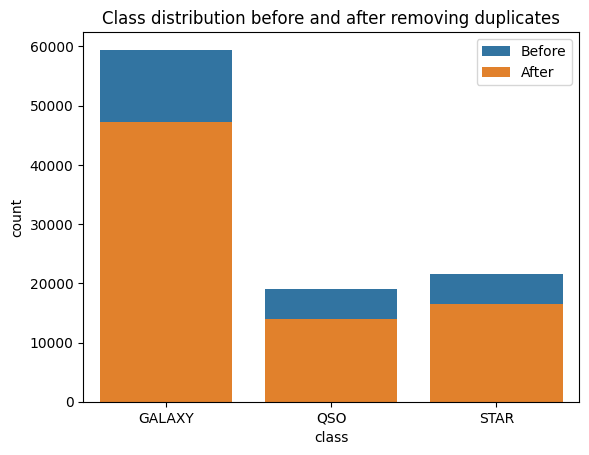

In [3]:
sns.countplot(x='class', data=df)
df = df.drop_duplicates(subset='obj_ID',keep='first')
df = df.drop(df[(df["class"] == "GALAXY") & (df["redshift"] == 0)].index)
sns.countplot(x='class', data=df)
plt.title('Class distribution before and after removing duplicates')
plt.legend(['Before','After'])

### Dealing with unwanted features

obj_ID, run_ID, camcol, field_ID, rerun_ID, plate, MJD, fiber_ID, spec_obj_id columns correspond to identifier of diverse measure equipment. We drop all this columns as they are not useful for our analysis. 

In [4]:
df=df.drop(['obj_ID','run_ID','rerun_ID','cam_col','field_ID','plate','MJD','fiber_ID','spec_obj_ID'], axis=1)

Alpha and Delta correspond to the coordinates of the object in the sky so we can drop them too as they are not useful for our analysis.

In [5]:
#drop the columns that are not relevant for the classification
df=df.drop(['alpha','delta'], axis=1)

### Visualizing the correlation between selected features

Text(0.5, 1.0, 'Correlation matrix')

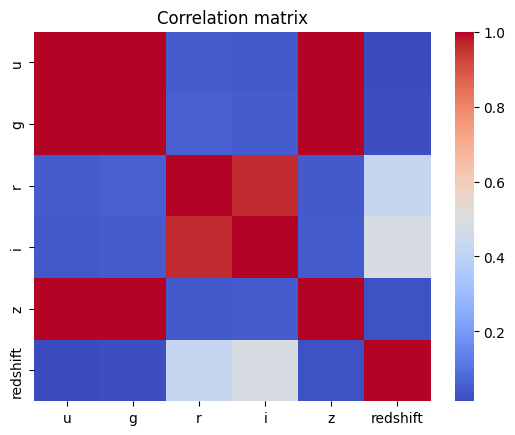

In [6]:
#correlation matrix
df_w = df.drop(['class'], axis=1)
corr = df_w.corr()
sns.heatmap(corr, annot=False, cmap='coolwarm')
plt.title('Correlation matrix')

### Visualizing the distribution of selected features

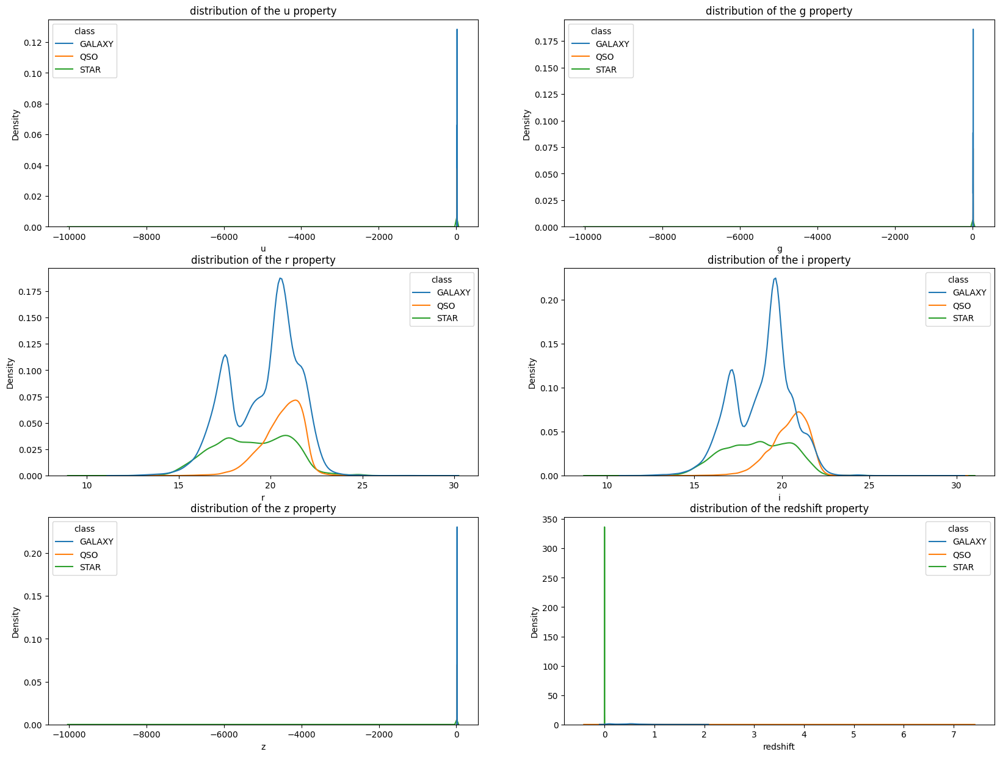

In [7]:
#data distribution
fig, axes = plt.subplots(3, 2, figsize=(20, 15))
axes = axes.flatten()
for i,var in enumerate(df_w.columns[:]):
    sns.kdeplot(data=df, x=var, hue='class', ax=axes[i])
    axes[i].set_title("distribution of the "+ var+" property")


For g, z, u and redshift we can see some abnormal values, but we can't realy see well the distribution of the data. Let's try to plot the data in log scale.

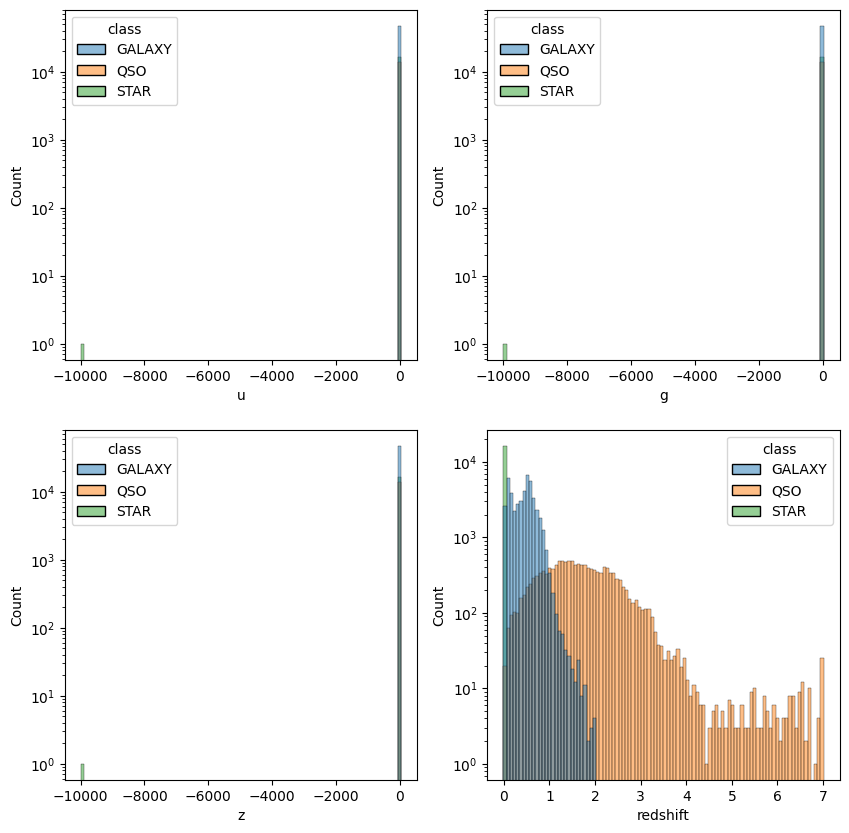

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()

sns.histplot(data=df, x='u', hue='class', bins=100, ax=axes[0])
axes[0].set_yscale('log')
sns.histplot(data=df, x='g', hue='class', bins=100, ax=axes[1])
axes[1].set_yscale('log')
sns.histplot(data=df, x='z', hue='class', bins=100, ax=axes[2])
axes[2].set_yscale('log')
sns.histplot(data=df, x='redshift', hue='class', bins=100, ax=axes[3])
axes[3].set_yscale('log')


Almost every value in g, z and u are close to 0, exept for 1 point near -100000. Let's remove it. 

In [9]:
df = df[df['g'] > -2000]
df = df[df['z'] > -2000]
df = df[df['u'] > -2000]

we then visualise the data plot against each other to see if we can see some correlation between them, and if some pair of data can be used to separate the classes.

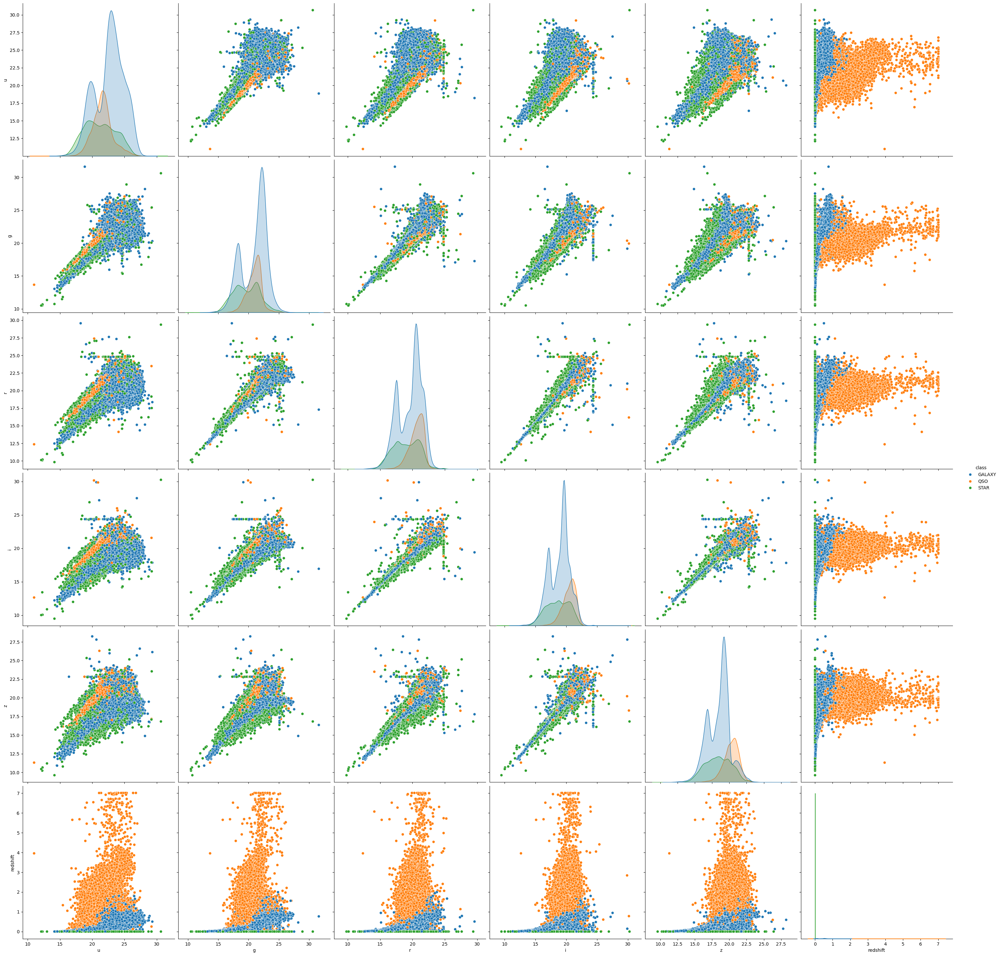

In [10]:
#show for each class the distribution of the features
sns.pairplot(df, hue='class', vars=['u','g','r','i','z','redshift'], height=5)

We clearly see that u,z,g,r,i are correlated as shown by the linear relation between them. We can also see that the redshift is not correlated with any of the other features but will be helpful to separate the classes.

## Dealing with outliers

### Using UMAP to reduce the dimensionality of the data

In [11]:
data = df.drop(['class'], axis=1)
labels = df['class']

In [12]:
import umap
import umap.plot
reducer = umap.UMAP(set_op_mix_ratio=0.008).fit(data)

/usr/local/lib/python3.9/site-packages/umap/plot.py:203: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit(nopython=False)


<Axes: >

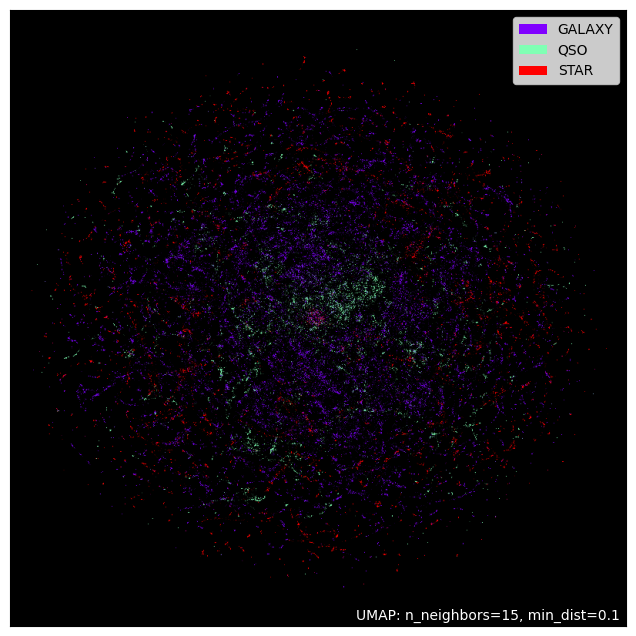

In [13]:
umap.plot.points(reducer, labels=labels, theme='fire')

### Detecting outliers using 3 different methods

Using each of the 3 methods, we detect outliers and remove them from the data. We then visualise the data to check and validate the results.

In [14]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.covariance import EllipticEnvelope

outlier_scores_LOF = LocalOutlierFactor(contamination=0.04).fit_predict(reducer.embedding_)
outlying_object_LOF = data[outlier_scores_LOF == -1]
outlier_scores_EE = EllipticEnvelope(contamination=0.04).fit_predict(reducer.embedding_)
outlying_object_EE = data[outlier_scores_EE == -1]
outlier_scores_IF = IsolationForest(contamination=0.04).fit_predict(reducer.embedding_)
outlying_object_IF = data[outlier_scores_IF == -1]


We plot the data in by class with inliners in red and detected outliers in blue.
Change the choosen_method variable to change the method used to detect outliers.

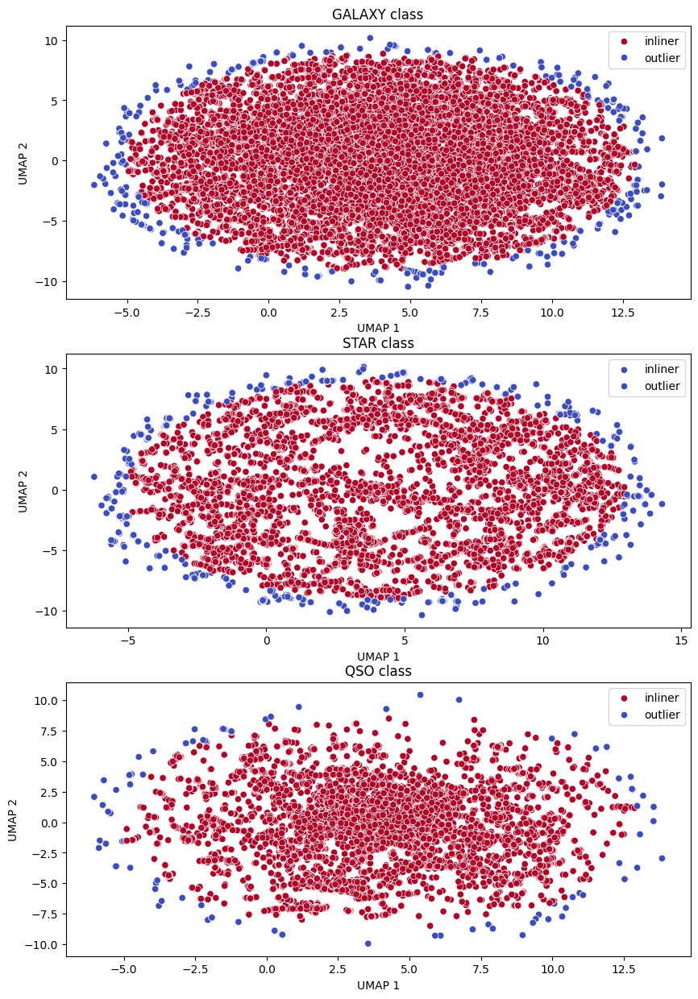

In [15]:
choosen_method = 'EE'

methods ={'LOF':outlier_scores_LOF, 'EE':outlier_scores_EE, 'IF':outlier_scores_IF}
reducer_embedding = pd.DataFrame(reducer.embedding_)
labels = labels.reset_index(drop=True)
outlier_scores = pd.DataFrame(methods[choosen_method])
fig, axes = plt.subplots(3, 1, figsize=(10, 15))
axes = axes.flatten()
sns.scatterplot(data=reducer_embedding[labels=="GALAXY"], x=0, y=1, hue=outlier_scores[labels=="GALAXY"][0], palette='coolwarm', ax=axes[0])
axes[0].set_title("GALAXY class")
axes[0].set_xlabel("UMAP 1")
axes[0].set_ylabel("UMAP 2")
axes[0].legend(["inliner", "outlier"])

sns.scatterplot(data=reducer_embedding[labels=="STAR"], x=0, y=1, hue=outlier_scores[labels=="STAR"][0], palette='coolwarm', ax=axes[1])
axes[1].set_title("STAR class")
axes[1].set_xlabel("UMAP 1")
axes[1].set_ylabel("UMAP 2")
axes[1].legend(["inliner", "outlier"])


sns.scatterplot(data=reducer_embedding[labels=="QSO"], x=0, y=1, hue=outlier_scores[labels=="QSO"][0], palette='coolwarm', ax=axes[2])
axes[2].set_title("QSO class")
axes[2].set_xlabel("UMAP 1")
axes[2].set_ylabel("UMAP 2")
axes[2].legend(["inliner", "outlier"])

it seems the best method is eliptic embedding as it work great for gaussian distribution wich seems to be the case for our data.

### Deleting outliers from the dataset

finally we delete the outliers from the dataset and create a new dataset with the remaining data.

In [16]:
outlier_scores=pd.DataFrame(outlier_scores_EE).reset_index(drop=True)
data = data.reset_index(drop=True)
labels = labels.reset_index(drop=True)
#keep data with outlier and without outlier
data_with_outlier = data.copy()
data_without_outlier = data.copy()
data_without_outlier = data[outlier_scores[0] == 1]
labels_without_outlier = labels[outlier_scores[0] == 1]
data_without_outlier = data.reset_index(drop=True)
labels_without_outlier = labels.reset_index(drop=True)

In [17]:
#save the data into interim folder
data_without_outlier.to_csv('../../data/interim/without_outlier.csv', index=False)
data_with_outlier.to_csv('../../data/interim/with_outlier.csv', index=False)

## Preprocessing the data and Feature Engineering

### Splitting the data into train and test sets

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42, stratify=labels)

### Feature Engineering with PCA

We use PCA to calculate the reducer and embedding of the train set 
PCA has been chosen with the help of the notebook DataCorrelation 

In [19]:
from sklearn.decomposition import PCA

group_ugriz = X_train[['u', 'g', 'r', 'i', 'z']]
pca = PCA(n_components=5).fit(group_ugriz)
pca_train = pd.DataFrame(pca.transform(group_ugriz), columns=['pca_ugriz_1', 'pca_ugriz_2', 'pca_ugriz_3', 'pca_ugriz_4', 'pca_ugriz_5'])
pca_test = pd.DataFrame(pca.transform(X_test[['u', 'g', 'r', 'i', 'z']]), columns=['pca_ugriz_1', 'pca_ugriz_2', 'pca_ugriz_3', 'pca_ugriz_4', 'pca_ugriz_5'])

In [20]:
pca_train = pca_train.reset_index(drop=True)
X_train = X_train.reset_index(drop=True)
data_train = pd.concat([pca_train, X_train["redshift"]], axis=1)
data_train.head()

,pca_ugriz_1,pca_ugriz_2,pca_ugriz_3,pca_ugriz_4,pca_ugriz_5,redshift
0,-3.031765,-1.380751,-0.288815,-0.116065,-0.222061,0.527754
1,3.586455,-1.691741,0.002591,0.054119,0.061615,0.260363
2,1.455414,-0.830106,0.329551,0.165811,0.057611,0.439555
3,4.893066,0.846859,-0.096438,-0.010842,-0.075089,0.067844
4,4.201342,2.042807,-1.198031,1.442723,-0.856656,0.062507


### Scaling the data

we use robust scaler to scale the data

In [21]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler().fit(data_train)
data_train = pd.DataFrame(scaler.transform(data_train), columns=['pca_ugriz_1', 'pca_ugriz_2', 'pca_ugriz_3', 'pca_ugriz_4', 'pca_ugriz_5', 'redshift'])
data_train.head()

,pca_ugriz_1,pca_ugriz_2,pca_ugriz_3,pca_ugriz_4,pca_ugriz_5,redshift
0,-0.291550,-0.541799,-0.508744,-0.668722,-2.073056,0.141525
1,0.761065,-0.677309,0.030581,0.305828,0.539846,-0.284074
2,0.422127,-0.301860,0.635707,0.945431,0.502967,0.001140
3,0.968878,0.428861,-0.152698,-0.066168,-0.719315,-0.590502
4,0.858861,0.949984,-2.191492,8.257611,-7.918229,-0.598996


## Visualizing final data

the new correlation matrix shows that the data aren't correlated anymore. 

Text(0.5, 1.0, 'Correlation matrix after PCA and scaling')

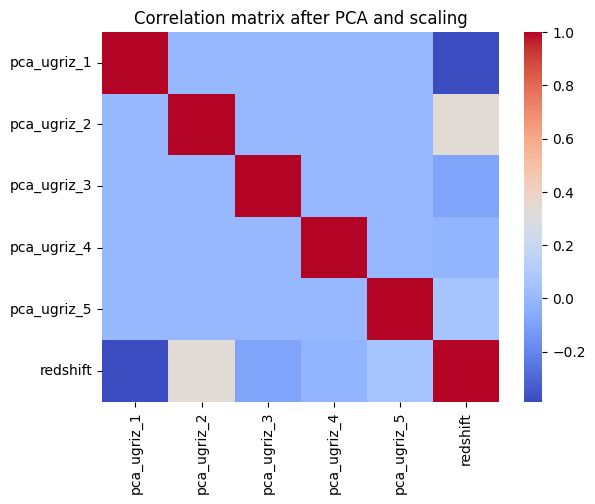

In [22]:
#correlation matrix
corr = data_train.corr()
sns.heatmap(corr, annot=False, cmap='coolwarm')
plt.title('Correlation matrix after PCA and scaling')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


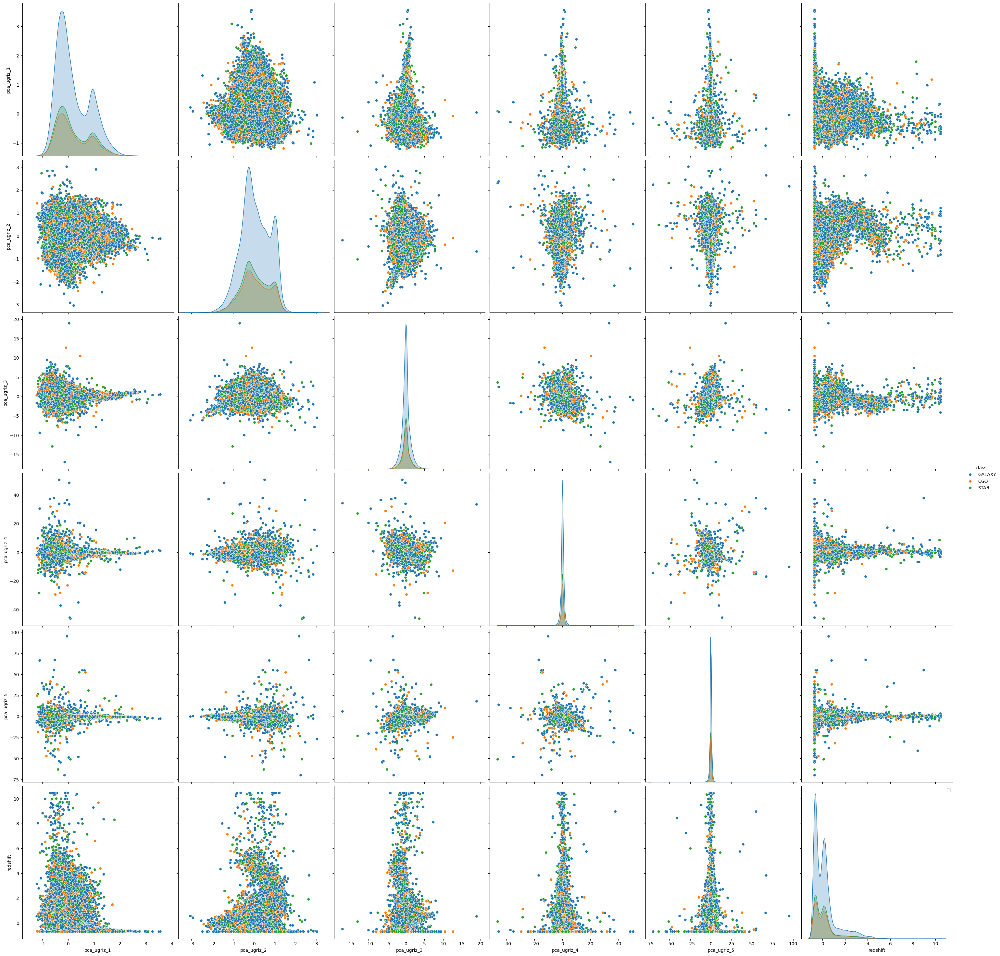

In [24]:
#pairplot
data_train['class'] = y_train
sns.pairplot(data_train, hue='class', vars=['pca_ugriz_1', 'pca_ugriz_2', 'pca_ugriz_3', 'pca_ugriz_4', 'pca_ugriz_5', 'redshift'], height=5)
plt.legend(loc='upper right')

the pair plot allow us to confirm that the data aren't correlated anymore

With build_features, we make 6 datasets. Three with the eliptic method for outlier detection and three without. For both this categories, we will find 1 with undersampling, 1 with oversampling and 1 with no re-sampling methods. (we have chosen the resampling methods with the help of the notebook Sampling methods)

We will then visualise them using UMAP as chosen best dimension reduction method for visualization in the notebook DataProjection

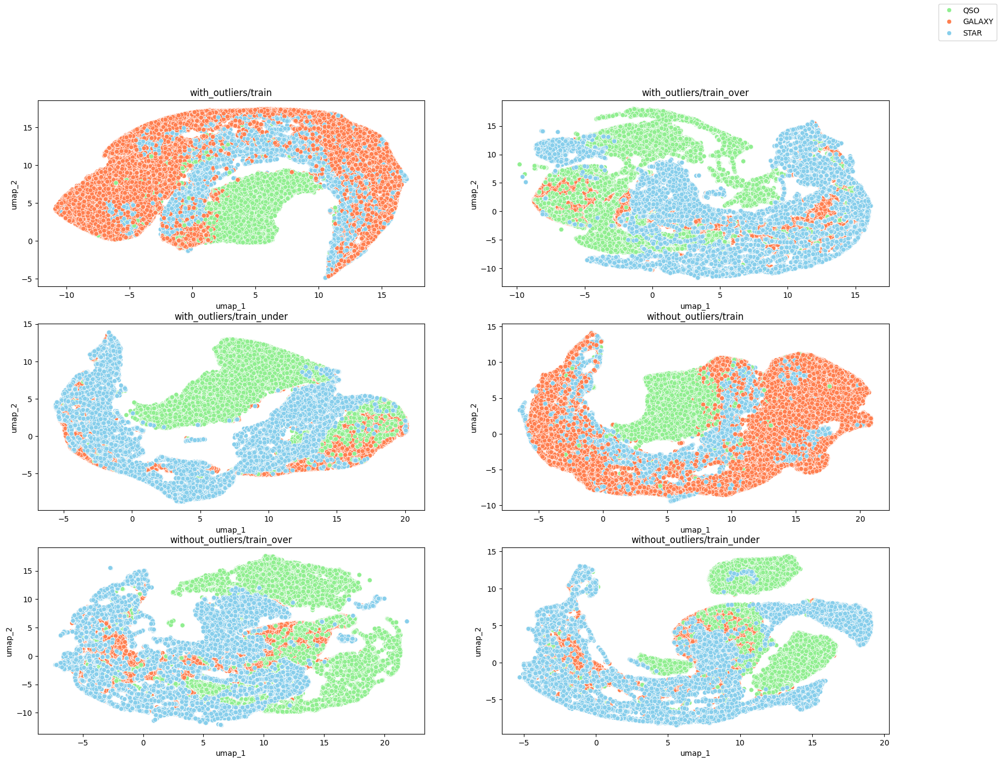

In [28]:
import umap
# Plot the 6 umap plots
fig, axes = plt.subplots(3, 2, figsize=(20, 15))
axes = axes.flatten()

class_colors = {
    "GALAXY": "coral",   
    "QSO": "lightgreen",      
    "STAR": "skyblue"    
}

path = "../../data/processed/"
outliers = ["with_outliers/", "without_outliers/"]
types = ["train", "train_over", "train_under"]

for i, outlier in enumerate(outliers):
    for j, type in enumerate(types):
        data_train = pd.read_csv(path + outlier + type+".csv")
        X,y = data_train.drop(['class'], axis=1), data_train['class']
        # umap
        embedding = pd.DataFrame(umap.UMAP().fit_transform(X))
        embedding['class'] = y
        embedding.columns = ['umap_1','umap_2','class']
        sns.scatterplot(data=embedding, x='umap_1', y='umap_2', hue='class', palette=class_colors, ax=axes[i*3+j])
        axes[i*3+j].set_title(outlier + type)
        axes[i*3+j].legend_.remove()

labels = axes[0].get_legend_handles_labels()
fig.legend(labels[0], labels[1], loc='upper right')
